## Usando un algoritmo para solucionar la ecuación diferencial

Recordemos que el modelo propuesto para los datos del crecimiento de la población es la solución analítica del siguiente problema de valor incial:
$$
\frac{dx(t)}{dt} = r x \left(1-\frac{x}{K}\right), \quad x(0) = x_{0}
$$
Afortunadamente esta ecuación es 'fácil' de solucionar analíticamente, sin embargo, ¿qué ocurre cuando no es sencillo encontrar la solución de la ecuación diferencial con valor inicial? En el siguiente código se soluciona este problema usando el método de Euler para problemas de valor inicial de la forma $\frac{dy}{dt} = f(t,y)$ con $y(t_0)=y_0$.

In [1]:
using Plots
using LinearAlgebra
using Distributions
using Statistics

function MetEuler(f, p, y0, t0, tn, h)
    # f: función que define la EDO dy/dt = f(t, y; p)
    # y0: condición inicial
    # t0: tiempo inicial
    # tn: tiempo final
    # h: tamaño del paso
    # p: parámetros de la función f

    # Número de pasos
    n_steps = Int((tn - t0) / h)
    
    t_values = zeros(n_steps + 1)
    y_values = zeros(n_steps + 1)

    # Acondiciones iniciales
    t_values[1] = t0
    y_values[1] = y0

    # Método de Euler
    for i in 1:n_steps
        t_values[i + 1] = t_values[i] + h
        y_values[i + 1] = y_values[i] + h * f(t_values[i], y_values[i],p)
    end

    return t_values, y_values
end

MetEuler (generic function with 1 method)

**Construcción de los datos**

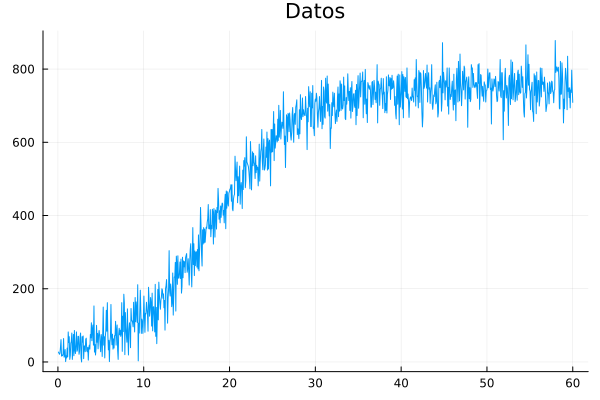

In [18]:
x0 = 20  # Población inicial
r0 = 0.2 # Tasa de crecimiento
K0 = 750 # Capacidad de carga
Tiempo = (1:1000)*(60/1000)

function sol_analitica(p)
    # solucion exacta de la ecuacion logistica 
    return x0 * p[2] ./ (x0 .+ (p[2] - x0) * exp.(-p[1] * Tiempo) )
end

function rhs(t,x,p)
    return p[1] * x * (1- x/p[2])
end
function sol_numerica(p)
    # solucion numérica de la ecuacion logistica 
    ti = 0
    tf = 60 
    d = 1000
    h = (tf-ti)/(d-1)
    return MetEuler(rhs,p,x0,ti,tf,h)[2]
end

#Construcción de los datos con el modelo analítico 
Crecimiento = sol_analitica((r0,K0)) + 40*randn(1000) #Adición de ruido
Crecimiento = Int.(floor.(abs.(Crecimiento)))

plot(Tiempo, Crecimiento,title="Datos", label=false)

En el siguiente gráfico se muestra la comparación entre el método de Euler y la solución analítica de la ecuación diferencial. Se nota la utilidad del método de Euler para proporcionar una solución.

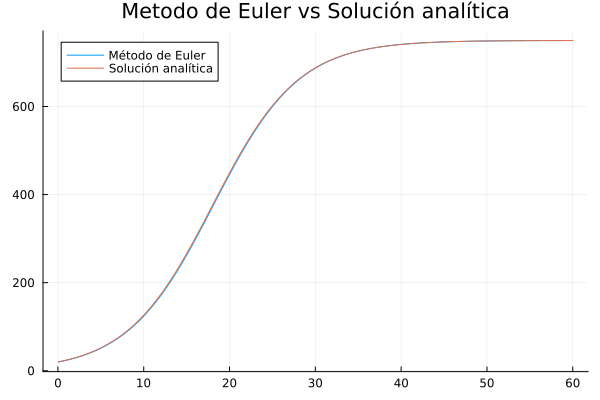

In [19]:
plot(Tiempo,sol_numerica((r0,K0)) , label="Método de Euler",title="Metodo de Euler vs Solución analítica")
plot!(Tiempo, sol_analitica((r0,K0)),label="Solución analítica")

**Energía**

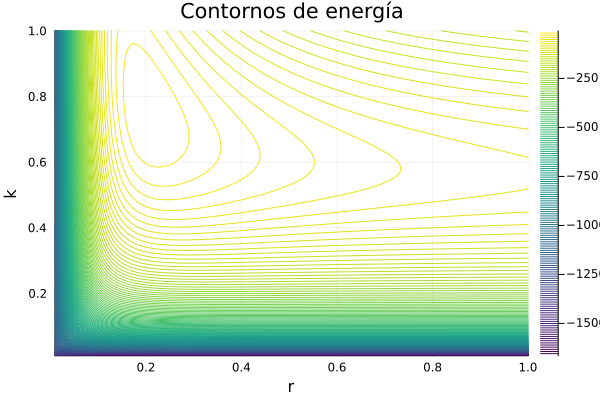

In [20]:
function energy(p) # log of the posterior
    r = 1*p[1]
    k = 1000*p[2]
    noisy_data = Crecimiento
    mu = sol_numerica((r,k))

    #log_likelihood = 1
    
    # negative binomial
    #omega = 2.0
    #eta = 10.0
    #r = mu ./(omega .- 1.0 .+ theta*mu)
    #q = 1.0 ./(omega .+ theta*mu)
    #log_likelihood = sum(logpdf(NegativeBinomial(r, q), noisy_data))

    # poisson
    log_likelihood = sum(logpdf.(Poisson.(mu), noisy_data))
    
    # gaussian
    #log_likelihood = sum(logpdf.(Normal.(mu, 100.0), noisy_data))
    
    log_prior = logpdf(Gamma(1,1), r) + logpdf(Gamma(1000,1), k)
    
    return (log_likelihood + log_prior)*(10^(-3))
end


function support(pa)
    # soporte de los parametros ""
    rt = true
    rt &= (0.0 < pa[1] < 1.0)
    rt &= (0.0 < pa[2] < 1.0)
    return rt
end



f(x, y) = energy((x,y))

x_range = 0.01:0.01:1
y_range = 0.01:0.01:1

# Inicializar matrices para la malla
mesh_x = zeros(length(x_range), length(y_range))
mesh_y = zeros(length(x_range), length(y_range))
# Llenar las matrices de la malla con valores de x e y
for i in 1:length(x_range)
    for j in 1:length(y_range)
        mesh_x[i, j] = x_range[i]
        mesh_y[i, j] = y_range[j]
    end
end
# Evaluar la función en cada punto de la malla
z_values = f.(mesh_y, mesh_x)

# Crear el gráfico de contornos
contour(x_range, y_range, z_values, levels=150, color=:viridis, xlabel="r", ylabel="k", title="Contornos de energía")

**Metropolis Hastings, muestreo sistemático y estimaciones**

In [21]:
# Número de iteraciones
iterations = 10000
# Punto inicial donde r y K seleccionados de manera aleatoria en (0,1)
samplesED = rand(2) 

probabilitiesED = [exp(energy(samplesED[:,end]))] # energía

Alpha = [0] # tasa de aceptación
sd = 0.1 # desviación estándar del camino aleatorio

# MHRW
for i in 1:iterations
    # Construcción de nuevas muestras con un camino aleatorio normal
    theta = samplesED[:,end]+ sd*randn(2)

    # Condición del soporte
    if support(theta) == false
        alpha = 0
        p2 = exp(energy(samplesED[:,end]))
    else
        p1 = exp(energy(theta))
        p2 = exp(energy(samplesED[:,end]))
        alpha = min(1, p1/p2)
    end 
    
    Alpha = hcat(Alpha,alpha)
    u = rand()

    #Selección de muestras
    if u < alpha
        samplesED = hcat(samplesED, theta)
        probabilitiesED = hcat(probabilitiesED,p1)
    else
        samplesED = hcat(samplesED, samplesED[:,end])
        probabilitiesED = hcat(probabilitiesED,p2)
    end
end



initial_position = floor(100*rand())
leap = 20
samplesED_ss = samplesED[:, Int(initial_position):leap:end]
probabilitiesED_ss = probabilitiesED[Int(initial_position):leap:end];

max_probED, positionED_ss = findmax(probabilitiesED_ss)
Max_likelihoodED = samplesED_ss[:, positionED_ss]
MeanED = mean(samplesED_ss, dims=2)

@show (r0,K0)
@show exp(max_probED)
@show Max_likelihoodED
@show MeanED;

(r0, K0) = (0.2, 750)
exp(max_probED) = 1.0008042803048103
Max_likelihoodED = [0.2009495909083159, 0.7506921192594628]
MeanED = [0.20387982716119213; 0.7513200931543763;;]


**Gráficos**

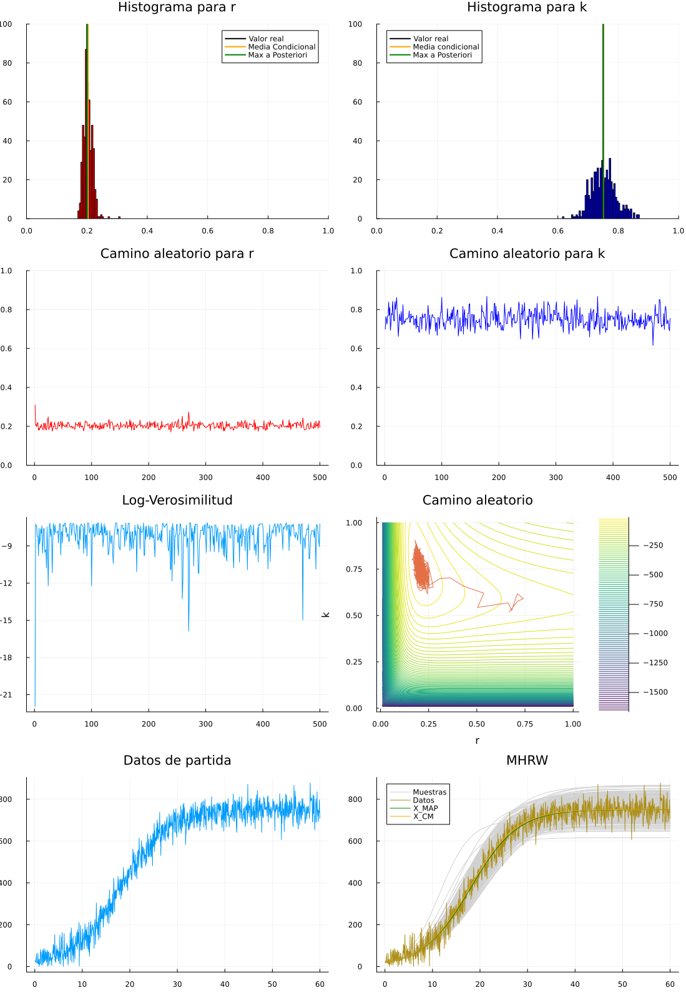

In [22]:
p1 = histogram(samplesED_ss[1,:],bins=50,label=false,color="red",xlim=(0,1),title="Histograma para r")
p1 = plot!([r0, r0], [0,100],linewidth=2,color="black", label="Valor real")
p1 = plot!([MeanED[1], MeanED[1]], [0,100],linewidth=2,color="orange", label="Media Condicional")
p1 = plot!([Max_likelihoodED[1], Max_likelihoodED[1]], [0,100],linewidth=2,color="green", label="Max a Posteriori")

p2 = histogram(samplesED_ss[2,:],bins=50,label=false,color="blue",xlim=(0,1),title="Histograma para k")
p2 = plot!([K0/10^3, K0/10^3],[0,100],linewidth=2, lcolor="black", label="Valor real")
p2 = plot!([MeanED[2], MeanED[2]], [0,100],linewidth=2,color="orange", label="Media condicional")
p2 = plot!([Max_likelihoodED[2], Max_likelihoodED[2]], [0,100],linewidth=2,color="green", label="Max a Posteriori")

p3 = plot(samplesED_ss[1,:],color="red",label = false,title="Camino aleatorio para r",ylim=(0,1))

p4 = plot(samplesED_ss[2,:],color="blue",label = false,title="Camino aleatorio para k",ylim=(0,1))

p5 = plot(log.(probabilitiesED_ss), label=false , title="Log-Verosimilitud")

p6 = contour(x_range, y_range, z_values, levels=100, color=:viridis, xlabel="r", ylabel="k",title="Camino aleatorio")
p6 = plot!(samplesED[1,:],samplesED[2,:],label=false)

p7 = plot(Tiempo, Crecimiento,label=false, title = "Datos de partida")

p8 = plot(Tiempo,sol_numerica((samplesED_ss[:,size(samplesED_ss)[2]][1],1000*samplesED_ss[:,size(samplesED_ss)[2]][2])),
    color="gray82",title="MHRW",label="Muestras",z=1,size=(1000, 600))
for j=1:(size(samplesED_ss)[2]-1)
   p8 = plot!(Tiempo,sol_numerica((1*samplesED_ss[:,j][1],1000*samplesED_ss[:,j][2])),color="gray82",label=false,z=1)
end
p8 = plot!(Tiempo, Crecimiento,label="Datos")
p8 = plot!(Tiempo, sol_numerica((Max_likelihoodED[1],1000*Max_likelihoodED[2])),color="green",label="X_MAP")
p8 = plot!(Tiempo, sol_numerica((MeanED[1],1000*MeanED[2])),color="orange",label="X_CM")


plot(p1,p2,p3,p4,p5,p6,p7,p8, layout=(4,2),size=(1100,1600))